<a href="https://colab.research.google.com/github/echukwuka/Cookbook/blob/master/Heart_Disease_Risk_Indicators_Workshop_Session_1_Exploratory_Analysis_in_python.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Key Indicators of Heart Disease (2020 annual CDC survey data of 400k adults related to their health status)**

data:https://www.kaggle.com/datasets/kamilpytlak/personal-key-indicators-of-heart-disease

Data size: approximately 400 thousand adults in the US, features:

**HeartDisease:** Respondents that have ever reported having coronary heart disease (CHD) or myocardial infarction (MI)

**BMI:** Body Mass Index (BMI)

**Smoking:** Have you smoked at least 100 cigarettes in your entire life? [Note: 5 packs = 100 cigarettes]

**AlcoholDrinking:** Heavy drinkers (adult men having more than 14 drinks per week and adult women having more than 7 drinks per week

**Stroke:** (Ever told) (you had) a stroke?

**PhysicalHealth:** Now thinking about your physical health, which includes physical illness and injury, for how many days during the past 30 days was your physical health not good? (0-30 days)

**MentalHealth:** Thinking about your mental health, for how many days during the past 30 days was your mental health not good? (0-30 days)

**DiffWalking:** Do you have serious difficulty walking or climbing stairs?
**Sex:** Are you male or female?

**AgeCategory:** Fourteen-level age category


#Import data and preview

In [1]:
## Load modules and libraries
import numpy as np 
import pandas as pd 

## Datalink
datalink = 'https://raw.githubusercontent.com/elabrodsky/tulanemba/main/heart_2020_cleaned.csv'

## Load data
df = pd.read_table(datalink, sep=',', header=(0)) 

## Display first few lines of the data
df.head()

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,No,16.60,Yes,No,No,3.0,30.0,No,Female,55-59,White,Yes,Yes,Very good,5.0,Yes,No,Yes
1,No,20.34,No,No,Yes,0.0,0.0,No,Female,80 or older,White,No,Yes,Very good,7.0,No,No,No
2,No,26.58,Yes,No,No,20.0,30.0,No,Male,65-69,White,Yes,Yes,Fair,8.0,Yes,No,No
3,No,24.21,No,No,No,0.0,0.0,No,Female,75-79,White,No,No,Good,6.0,No,No,Yes
4,No,23.71,No,No,No,28.0,0.0,Yes,Female,40-44,White,No,Yes,Very good,8.0,No,No,No


In [ ]:
df.shape

(319795, 18)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319795 entries, 0 to 319794
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   HeartDisease      319795 non-null  object 
 1   BMI               319795 non-null  float64
 2   Smoking           319795 non-null  object 
 3   AlcoholDrinking   319795 non-null  object 
 4   Stroke            319795 non-null  object 
 5   PhysicalHealth    319795 non-null  float64
 6   MentalHealth      319795 non-null  float64
 7   DiffWalking       319795 non-null  object 
 8   Sex               319795 non-null  object 
 9   AgeCategory       319795 non-null  object 
 10  Race              319795 non-null  object 
 11  Diabetic          319795 non-null  object 
 12  PhysicalActivity  319795 non-null  object 
 13  GenHealth         319795 non-null  object 
 14  SleepTime         319795 non-null  float64
 15  Asthma            319795 non-null  object 
 16  KidneyDisease     31

#Numerical exploratory data analysis

## Column Data Types

In [ ]:
# How may numerical columns in the data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319795 entries, 0 to 319794
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   HeartDisease      319795 non-null  object 
 1   BMI               319795 non-null  float64
 2   Smoking           319795 non-null  object 
 3   AlcoholDrinking   319795 non-null  object 
 4   Stroke            319795 non-null  object 
 5   PhysicalHealth    319795 non-null  float64
 6   MentalHealth      319795 non-null  float64
 7   DiffWalking       319795 non-null  object 
 8   Sex               319795 non-null  object 
 9   AgeCategory       319795 non-null  object 
 10  Race              319795 non-null  object 
 11  Diabetic          319795 non-null  object 
 12  PhysicalActivity  319795 non-null  object 
 13  GenHealth         319795 non-null  object 
 14  SleepTime         319795 non-null  float64
 15  Asthma            319795 non-null  object 
 16  KidneyDisease     31

##Statistical summary of numerical columns

In [ ]:
# summary of data
df.describe()

,BMI,PhysicalHealth,MentalHealth,SleepTime
count,319795.000000,319795.00000,319795.000000,319795.000000
mean,28.325399,3.37171,3.898366,7.097075
std,6.356100,7.95085,7.955235,1.436007
min,12.020000,0.00000,0.000000,1.000000
25%,24.030000,0.00000,0.000000,6.000000
50%,27.340000,0.00000,0.000000,7.000000
75%,31.420000,2.00000,3.000000,8.000000
max,94.850000,30.00000,30.000000,24.000000


## Make the statistical summary presentable

In [ ]:
df.describe()[1:][['BMI','PhysicalHealth','MentalHealth', 'SleepTime']].T

,mean,std,min,25%,50%,75%,max
BMI,28.325399,6.356100,12.02,24.03,27.34,31.42,94.85
PhysicalHealth,3.371710,7.950850,0.00,0.00,0.00,2.00,30.00
MentalHealth,3.898366,7.955235,0.00,0.00,0.00,3.00,30.00
SleepTime,7.097075,1.436007,1.00,6.00,7.00,8.00,24.00


In [ ]:
# Summary of data, leave out count, transpose and beautify the output
df.describe()[1:][['BMI','PhysicalHealth','MentalHealth', 'SleepTime']].T.style.background_gradient(cmap='Reds')

,mean,std,min,25%,50%,75%,max
BMI,28.325399,6.356100,12.020000,24.030000,27.340000,31.420000,94.850000
PhysicalHealth,3.371710,7.950850,0.000000,0.000000,0.000000,2.000000,30.000000
MentalHealth,3.898366,7.955235,0.000000,0.000000,0.000000,3.000000,30.000000
SleepTime,7.097075,1.436007,1.000000,6.000000,7.000000,8.000000,24.000000


## Summary of categorical columns
Cound the number of yes and NO in each of the respective columns

In [ ]:
df.shape

(319795, 18)

In [ ]:
# Count the numbero of yes and no in columns
df['HeartDisease'].value_counts()
#df['HeartDisease'].value_counts().sum()

No     292422
Yes     27373
Name: HeartDisease, dtype: int64

In [ ]:
# Count the numbero of yes and no in columns
df['GenHealth'].value_counts()

Very good    113858
Good          93129
Excellent     66842
Fair          34677
Poor          11289
Name: GenHealth, dtype: int64

In [ ]:
print('Heart Disease stats in this data: \n')
print(df['HeartDisease'].value_counts()/df['HeartDisease'].value_counts().sum())


Heart Disease stats in this data: 

No     0.914405
Yes    0.085595
Name: HeartDisease, dtype: float64


In [ ]:
## Compile the percentage of yes and no in each columns
print('Heart Disease stats in this data: \n')
print(df['HeartDisease'].value_counts()/df['HeartDisease'].value_counts().sum())
print('\n')
print('Smoking stats in this data: \n')
print(df['Smoking'].value_counts()/df['Smoking'].value_counts().sum())
print('\n')
print('Alcohol Drinking stats in this data: \n')
print(df['AlcoholDrinking'].value_counts()/df['AlcoholDrinking'].value_counts().sum())
print('\n')
print('Stroke stats in this data: \n')
print(df['Stroke'].value_counts()/df['Stroke'].value_counts().sum())
print('\n')
print('Sex stats in this data: \n')
print(df['Sex'].value_counts()/df['Sex'].value_counts().sum())
print('\n')

Heart Disease stats in this data: 

No     0.914405
Yes    0.085595
Name: HeartDisease, dtype: float64


Smoking stats in this data: 

No     0.587523
Yes    0.412477
Name: Smoking, dtype: float64


Alcohol Drinking stats in this data: 

No     0.931903
Yes    0.068097
Name: AlcoholDrinking, dtype: float64


Stroke stats in this data: 

No     0.96226
Yes    0.03774
Name: Stroke, dtype: float64


Sex stats in this data: 

Female    0.524727
Male      0.475273
Name: Sex, dtype: float64




## Summary of different factors and their association with heart diseases
Two factor associations

crosstab function enables making simple to complex counting of categorical columns according to an index and their related columns.


In [ ]:
pd.crosstab(df['HeartDisease'], df['Smoking'], margins=True)

Smoking,No,Yes,All
HeartDisease,,,
No,176551,115871,292422
Yes,11336,16037,27373
All,187887,131908,319795


In [ ]:
pd.crosstab(df['HeartDisease'],
            df['Smoking'], 
            margins=True).style.background_gradient(cmap='Reds')

Smoking,No,Yes,All
HeartDisease,,,
No,176551,115871,292422
Yes,11336,16037,27373
All,187887,131908,319795


### Normalize by row
How many of the Heart Disease patients have a smoking history? 

In [ ]:
pd.crosstab(index=df['HeartDisease'],
            columns=df['Smoking'], 
            margins=True, normalize = 'index')

Smoking,No,Yes
HeartDisease,,
No,0.603754,0.396246
Yes,0.414131,0.585869
All,0.587523,0.412477


In [ ]:
pd.crosstab(index=df['HeartDisease'],
            columns=df['Smoking'], 
            margins = True, normalize = 'index').style.format("{:.0%}").background_gradient(cmap='Reds', axis='index')

Smoking,No,Yes
HeartDisease,,
No,60%,40%
Yes,41%,59%
All,59%,41%


### Normalize by column
Whether heart disease is prevalent in smokers? 
How many of the smokers contract heart disease?

In [ ]:
pd.crosstab(index=df['HeartDisease'],
            columns=df['Smoking'], 
            margins=True, normalize = 'columns').style.format("{:.0%}").background_gradient(cmap='Reds', axis='columns')

Smoking,No,Yes,All
HeartDisease,,,
No,94%,88%,91%
Yes,6%,12%,9%


### Two factor and multi-level associations

#### Is Heart diseases prevalent in smoking male or smoking female?

In [ ]:
pd.crosstab(index=df['HeartDisease'],
            columns=[df['Sex'], 
                     df['Smoking']], 
            margins=True, normalize = 'index').style.format("{:.0%}").background_gradient(cmap='Reds', axis='columns')

###Is Heart diseases prevalent in drinking male or drinking female?

In [ ]:
pd.crosstab(index=df['HeartDisease'],
            columns=[df['Sex'], 
                     df['AlcoholDrinking']], 
            margins=True, normalize = 'index').style.format("{:.0%}").background_gradient(cmap='Reds', axis='columns')

### Is Stroke a risk factor for Heart disease in male vs female?

In [ ]:
pd.crosstab(index=df['HeartDisease'],
            columns=[df['Sex'], 
                     df['Stroke']], 
            margins=True, normalize = 'index').style.format("{:.0%}").background_gradient(cmap='Reds', axis='columns')

In [ ]:
pd.crosstab(index=df['HeartDisease'],
            columns=[df['Sex'],
                     df['Smoking'], 
                     df['Stroke']], 
            margins=True, normalize = 'index').style.format("{:.0%}").background_gradient(cmap='Reds', axis='columns')

#Exploratory data analysis: Visualization

In order to visulaize, convert the yes/no fields to numerical values by counting them.

In [ ]:
import pandas as pd
Cat_Num = pd.DataFrame()
Cat_Num['HeartDisease'] = pd.DataFrame(df['HeartDisease'].value_counts()/df['HeartDisease'].value_counts().sum())
Cat_Num['Smoking'] = pd.DataFrame(df['Smoking'].value_counts()/df['Smoking'].value_counts().sum())
Cat_Num['AlcoholDrinking'] = pd.DataFrame(df['AlcoholDrinking'].value_counts()/df['AlcoholDrinking'].value_counts().sum())
Cat_Num['Stroke'] = pd.DataFrame(df['Stroke'].value_counts()/df['Stroke'].value_counts().sum())

Cat_Num.style.format("{:.1%}")

,HeartDisease,Smoking,AlcoholDrinking,Stroke
No,91.4%,58.8%,93.2%,96.2%
Yes,8.6%,41.2%,6.8%,3.8%


In [ ]:
pd.DataFrame(df['Smoking'].value_counts()/df['Smoking'].value_counts().sum())

,Smoking
No,0.587523
Yes,0.412477


In [ ]:
df[df['HeartDisease'] == "Yes"]['Smoking'].value_counts()/df[df['HeartDisease'] == "Yes"]['Smoking'].value_counts().sum()

Yes    0.585869
No     0.414131
Name: Smoking, dtype: float64

## Visualize the above data in Pie chart

In [ ]:
import plotly.express as px

## Pie chart/Donut chart
fig = px.pie(values=(df[df['HeartDisease'] == "Yes"]['Smoking'].value_counts()/df[df['HeartDisease'] == "Yes"]['Smoking'].value_counts().sum()), names=Cat_Num.index, hole = 0.5)

fig.update_layout(
    title_text="Stats for Categorical Variables",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Heart Disease for Smokers', x=0.5, y=0.5, font_size=15, showarrow=False)])

## Plot size
fig.update_layout(height=400, width=400)
fig.show()

In [ ]:
import plotly.express as px

## Pie chart/Donut chart
fig = px.pie(values=Cat_Num['HeartDisease'], names=Cat_Num.index, hole = 0.5)

fig.update_layout(
    title_text="Stats for Categorical Variables",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Heart Disease', x=0.5, y=0.5, font_size=15, showarrow=False)])

## Plot size
fig.update_layout(height=400, width=400)
fig.show()

In [ ]:
import plotly.express as px

## Pie chart/Donut chart
fig = px.pie(values=Cat_Num['Smoking'], names=Cat_Num.index, hole = 0.5)
fig.update_layout(
    title_text="Stats for Categorical Variables",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Smoking', x=0.5, y=0.5, font_size=15, showarrow=False)])

## Plot size
fig.update_layout(height=400, width=400)
fig.show()

#Convert all the fields/features to numerical data type

In [ ]:
### convert data to numeric
from sklearn import preprocessing

## duplicate the dataframe
df_num = df

## Define age categories for user-defined encoding
encode_AgeCategory = {'55-59':57, '80 or older':80, '65-69':67,
                      '75-79':77,'40-44':42,'70-74':72,'60-64':62,
                      '50-54':52,'45-49':47,'18-24':21,'35-39':37,
                      '30-34':32,'25-29':27}

## Encode age category into respective numbers
df_num['AgeCategory'] = df_num['AgeCategory'].apply(lambda x: encode_AgeCategory[x])

## Convert the datatype to float
df_num['AgeCategory'] = df_num['AgeCategory'].astype('float')


## Define Health categories for user-defined encoding
encode_GenHealth = {'Poor':0, 'Fair':1, 'Good':2,
                      'Very good':3,'Excellent':4}

## Encode Health category
df_num['GenHealth'] = df_num['GenHealth'].apply(lambda x: encode_GenHealth[x])

## Convert the datatype to float
df_num['GenHealth'] = df_num['GenHealth'].astype('float')

## Integer encode columns with 2 unique values
for col in ['Smoking', 'AlcoholDrinking', 'Stroke', 'DiffWalking', 'Sex', 'PhysicalActivity', 'Asthma', 'KidneyDisease', 'SkinCancer']:
    if df[col].dtype == 'O':     ### select only columns with object datatype
        le = preprocessing.LabelEncoder()
        df_num[col] = le.fit_transform(df[col])

## One-hot encode columns with more than 2 unique values
## This will create multiple columns for Race with defined prefix
df_num = pd.get_dummies(df, columns=['Race', 'Diabetic'], prefix = ['Race', 'Diabetic'])

## Display the dataframe
df_num.head()

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,...,Race_American Indian/Alaskan Native,Race_Asian,Race_Black,Race_Hispanic,Race_Other,Race_White,Diabetic_No,"Diabetic_No, borderline diabetes",Diabetic_Yes,Diabetic_Yes (during pregnancy)
0,No,16.60,1,0,0,3.0,30.0,0,0,57.0,...,0,0,0,0,0,1,0,0,1,0
1,No,20.34,0,0,1,0.0,0.0,0,0,80.0,...,0,0,0,0,0,1,1,0,0,0
2,No,26.58,1,0,0,20.0,30.0,0,1,67.0,...,0,0,0,0,0,1,0,0,1,0
3,No,24.21,0,0,0,0.0,0.0,0,0,77.0,...,0,0,0,0,0,1,1,0,0,0
4,No,23.71,0,0,0,28.0,0.0,1,0,42.0,...,0,0,0,0,0,1,1,0,0,0


In [ ]:
df['Race'].unique()

array(['White', 'Black', 'Asian', 'American Indian/Alaskan Native',
       'Other', 'Hispanic'], dtype=object)

In [ ]:
pd.get_dummies(df['Race']).head()

,American Indian/Alaskan Native,Asian,Black,Hispanic,Other,White
0,0,0,0,0,0,1
1,0,0,0,0,0,1
2,0,0,0,0,0,1
3,0,0,0,0,0,1
4,0,0,0,0,0,1


In [ ]:
import plotly.express as px

## Duplicate to another dataframe
df_num1 = df_num

## Encode the Heart disease column as well
df_num1['HeartDisease'] = df_num1['HeartDisease'].map(dict(Yes=1, No=0))

## Plot plotly heatmap with correlation coefficient values
fig = px.imshow(df_num1[['HeartDisease', 'Smoking', 'AlcoholDrinking', 'Stroke', 'DiffWalking', 'Sex',
                    'PhysicalActivity', 'Asthma', 'KidneyDisease', 'SkinCancer','BMI', 'PhysicalHealth',
                    'MentalHealth', 'AgeCategory', 'SleepTime']].corr(),color_continuous_scale="Reds")
## Plot size
fig.update_layout(height=800)
fig.show()

#Principal component Analysis

Perform PCA for visual exploration of all data

In [ ]:
from sklearn.preprocessing import StandardScaler 
from sklearn.decomposition import PCA 

## Scale and center the data
scaled = StandardScaler() 
scaled.fit(df_num1) 
scaled_data = scaled.transform(df_num1) 

#Run Principal Component Analysis
pca = PCA(n_components=3) 
pca.fit(scaled_data) 
xpca = pca.transform(scaled_data)

## Define the variance explained format for the components
PC1_label = "PC1 {}%".format(round((100*pca.explained_variance_ratio_[0]),2))
PC2_label = "PC2 {}%".format(round((100*pca.explained_variance_ratio_[1]),2)) 
PC3_label = "PC3 {}%".format(round((100*pca.explained_variance_ratio_[2]),2))

#create dataframe for PCA
df_pca = pd.DataFrame(xpca)
df_pca.columns = [PC1_label,PC2_label,PC3_label]

In [ ]:
#visualize
import plotly.express as px
figPCA = px.scatter(df_pca, 
                    x=PC1_label, 
                    y=PC2_label,
                    title="PCA 2D plot", 
                    color=df.HeartDisease,
                    template="plotly_white",
                    opacity=0.5, 
                    height=800)

figPCA.update_traces(marker=dict(size=10, line=dict(width=2, color='Black')))
figPCA.show()

In [ ]:
#visualize
import plotly.express as px
figPCA = px.scatter_3d(df_pca, 
                    x=PC1_label, 
                    y=PC2_label,
                    z=PC3_label,
                    title="PCA 3D plot", 
                    color=df.HeartDisease,
                    template="plotly_white",
                    height=800)
figPCA.update_traces(marker=dict(size=10, line=dict(width=2, color='Black')))
figPCA.show()

Since we can see distinct clusters in the PCA, we will remove features creating such batches. In this case through elimination, the feature introducing such batches is 'Race_white'

(elimination was performed with binary features such as 'Sex', 'Asthma', 'Smoking', etc.)

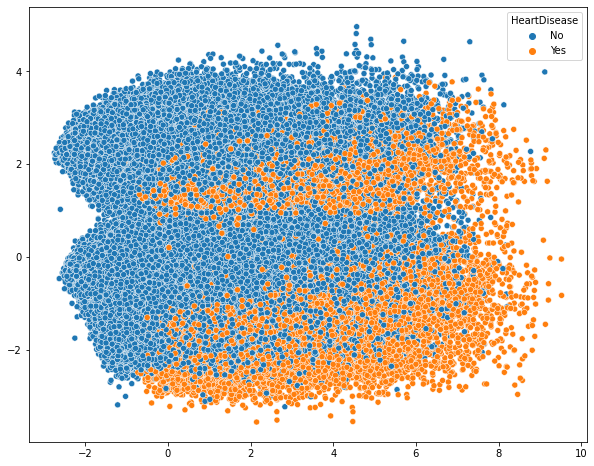

In [ ]:
import matplotlib.pyplot as plt
import seaborn
plt.rcParams['figure.figsize'] = [10, 8]
seaborn.scatterplot(x=xpca[:,0], y=xpca[:,1], hue=df.HeartDisease)
plt.show()

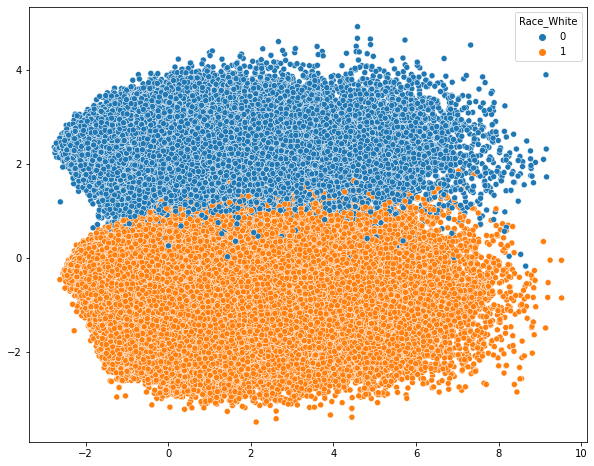

In [ ]:
import matplotlib.pyplot as plt
import seaborn
plt.rcParams['figure.figsize'] = [10, 8]
seaborn.scatterplot(x=xpca[:,0], y=xpca[:,1], hue=df_num1['Race_White'])
plt.show()

In [ ]:
df_num1.shape

(319795, 26)

In [ ]:
df_num1.columns

Index(['HeartDisease', 'BMI', 'Smoking', 'AlcoholDrinking', 'Stroke',
       'PhysicalHealth', 'MentalHealth', 'DiffWalking', 'Sex', 'AgeCategory',
       'PhysicalActivity', 'GenHealth', 'SleepTime', 'Asthma', 'KidneyDisease',
       'SkinCancer', 'Race_American Indian/Alaskan Native', 'Race_Asian',
       'Race_Black', 'Race_Hispanic', 'Race_Other', 'Race_White',
       'Diabetic_No', 'Diabetic_No, borderline diabetes', 'Diabetic_Yes',
       'Diabetic_Yes (during pregnancy)'],
      dtype='object')

##Eliminate confounding factors

In [ ]:
df_num1.iloc[:,0:21].columns

Index(['HeartDisease', 'BMI', 'Smoking', 'AlcoholDrinking', 'Stroke',
       'PhysicalHealth', 'MentalHealth', 'DiffWalking', 'Sex', 'AgeCategory',
       'PhysicalActivity', 'GenHealth', 'SleepTime', 'Asthma', 'KidneyDisease',
       'SkinCancer', 'Race_American Indian/Alaskan Native', 'Race_Asian',
       'Race_Black', 'Race_Hispanic', 'Race_Other'],
      dtype='object')

In [ ]:
df_numX.columns

Index(['HeartDisease', 'BMI', 'Smoking', 'AlcoholDrinking', 'Stroke',
       'PhysicalHealth', 'MentalHealth', 'DiffWalking', 'Sex', 'AgeCategory',
       'PhysicalActivity', 'GenHealth', 'SleepTime', 'Asthma', 'KidneyDisease',
       'SkinCancer', 'Race_American Indian/Alaskan Native', 'Race_Asian',
       'Race_Black', 'Race_Hispanic', 'Race_Other'],
      dtype='object')

In [ ]:
df_numX = df_num1.iloc[:,0:21]

#df_numX = df_num1
#del df_numX['Race_White']

scaled = StandardScaler() 
scaled.fit(df_numX) 
scaled_data = scaled.transform(df_numX) 

#Run Principal Component Analysis
pca = PCA(n_components=3) 
pca.fit(scaled_data) 
xpca = pca.transform(scaled_data)

PC1_label = "PC1 {}%".format(round((100*pca.explained_variance_ratio_[0]),2))
PC2_label = "PC2 {}%".format(round((100*pca.explained_variance_ratio_[1]),2)) 
PC3_label = "PC3 {}%".format(round((100*pca.explained_variance_ratio_[2]),2))

#create dataframe for PCA
df_pca = pd.DataFrame(xpca)
df_pca.columns = [PC1_label,PC2_label,PC3_label]

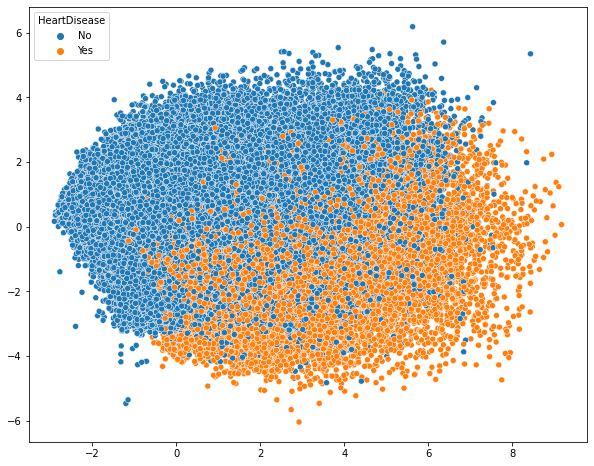

In [ ]:
import matplotlib.pyplot as plt
import seaborn
plt.rcParams['figure.figsize'] = [10, 8]
seaborn.scatterplot(x=xpca[:,0], y=xpca[:,1], hue=df.HeartDisease)
plt.show()

In [ ]:
#visualize
import plotly.express as px
figPCA = px.scatter_3d(df_pca, 
                    x=PC1_label, 
                    y=PC2_label,
                    z=PC3_label,
                    title="PCA 3D plot", 
                    color=df.HeartDisease,
                    template="plotly_white",
                    height=800)
figPCA.update_traces(marker=dict(size=10, line=dict(width=2, color='Black')))
figPCA.show()